In [12]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
import os
os.chdir('/content/drive/MyDrive/Phenology_GEE_Download')
print(os.getcwd())

/content/drive/MyDrive/Phenology_GEE_Download


In [15]:
!pip install -r requirement_package_installation.txt

In [4]:
import ee
import os
import random
ee.Authenticate()
ee.Initialize(project = 'tony-1122')
print(ee.String('Hello from the Earth Engine servers!').getInfo())

Hello from the Earth Engine servers!


In [5]:
%%capture
if 'google.colab' in str(get_ipython()):
  !apt-get install gdal-bin
  !pip install leafmap(raster)

!gdalinfo --version

In [6]:
from google.colab import auth
auth.authenticate_user()

In [7]:
# Path to the folder you want to create
folder_path = '/content/Phenological_project'

# Create the folder if it does not exist
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print("Folder created")
else:
    print("Folder already exists")

Folder created


In [28]:
# Base path for the folders
base_path = '/content/Phenological_project/Images'

# List of folder names to create
folders = ['s2', 'label', 'COG']
# folders = ['s2']
# Loop through the folder names and create each one
for folder in folders:
    folder_path = os.path.join(base_path, folder)
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
        print(f"Folder '{folder}' created")
    else:
        print(f"Folder '{folder}' already exists")

Folder 's2' created
Folder 'label' already exists
Folder 'COG' already exists


In [18]:
country = 'texas'
year = 2023
!python exportsS2A_yearly.py "projects/tony-1122/assets/TTU/sorghum/phenology/{country}_centroid" 2023

Processing 18 samples from the collection: projects/tony-1122/assets/TTU/sorghum/phenology/texas_centroid for the year 2023
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 4 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 2 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 0 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 1 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 3 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 5 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
s2 images: 12 (512, 512, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...7

<ipython-input-21-d06f0ffb09f6>:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust for colorbar


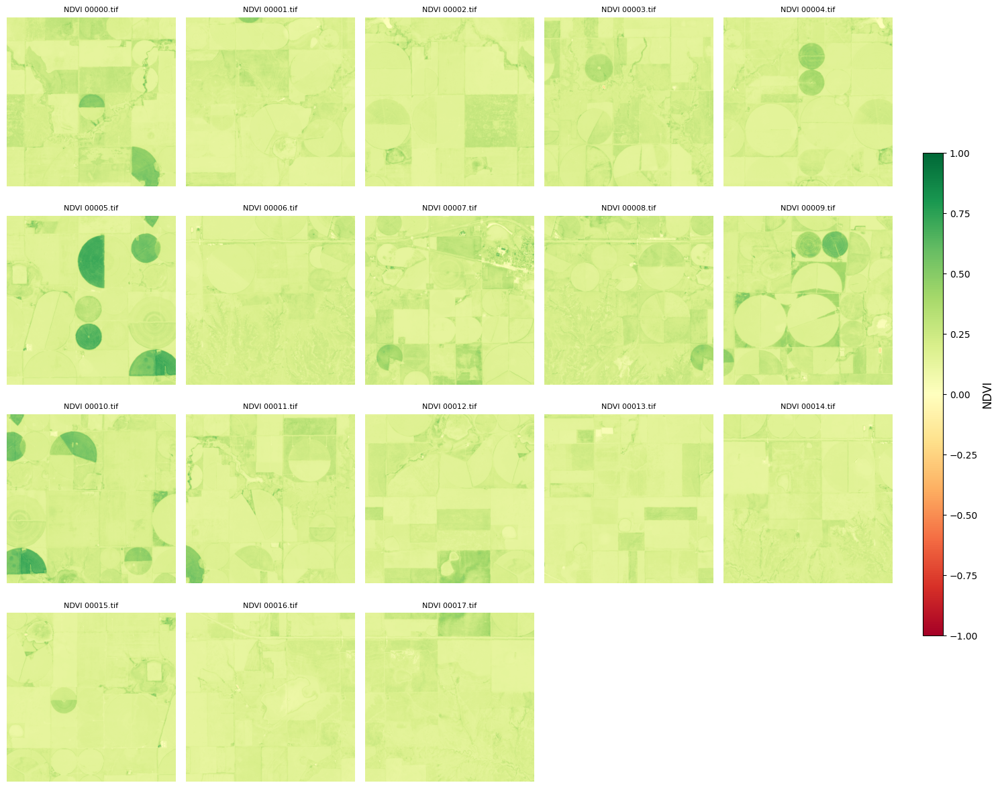

In [21]:
import os
import glob
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Directory containing NDVI TIFF files
tif_dir = "/content/Phenological_project/Images/s2"

# Get all TIFF file paths
tif_files = sorted(glob.glob(os.path.join(tif_dir, "*.tif")))

# Select the first 20 files (adjust as needed)
num_images = min(len(tif_files), 20)

# Define subplot grid (4 rows, 5 columns)
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 12))
axes = axes.ravel()  # Flatten for easy indexing

# Create a single colorbar axis
cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])  # Adjust colorbar position

# Loop through selected NDVI files
for i in range(num_images):
    with rasterio.open(tif_files[i]) as src:
        ndvi = src.read(1).astype(float)  # Read NDVI band

    # Clip NDVI values to range -1 to 1
    ndvi = np.clip(ndvi, -1, 1)

    # Plot NDVI map
    img = axes[i].imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    axes[i].set_title(f"NDVI {os.path.basename(tif_files[i])}", fontsize=8)
    axes[i].axis("off")

# Hide any unused subplots
for i in range(num_images, len(axes)):
    axes[i].axis("off")

# Add a colorbar
cbar = fig.colorbar(img, cax=cbar_ax)
cbar.set_label("NDVI", fontsize=12)

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust for colorbar
plt.show()


### Download timeseries pertile

In [27]:
!rm -rf /content/Phenological_project/Images/s2

In [29]:
country = 'texas'
year = 2023
!python exportsS2A_timeseries.py "projects/tony-1122/assets/TTU/sorghum/phenology/{country}_centroid_test" 2023

Processing 4 tiles for the year 2023
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 0 date 20230102: (512, 512, 1, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 2 date 20230102: (512, 512, 1, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 1 date 20230102: (512, 512, 1, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 3 date 20230102: (512, 512, 1, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 2 date 20230105: (512, 512, 1, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 0 date 20230105: (512, 512, 1, 1)
Input file size is 512, 512
0...10...20...30...40...50...60...70...80...90...100 - done.
Saved tile 1 date 20230105: (512, 512, 1, 1)
Input file size is 512, 5

<ipython-input-31-3e8453a106bd>:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


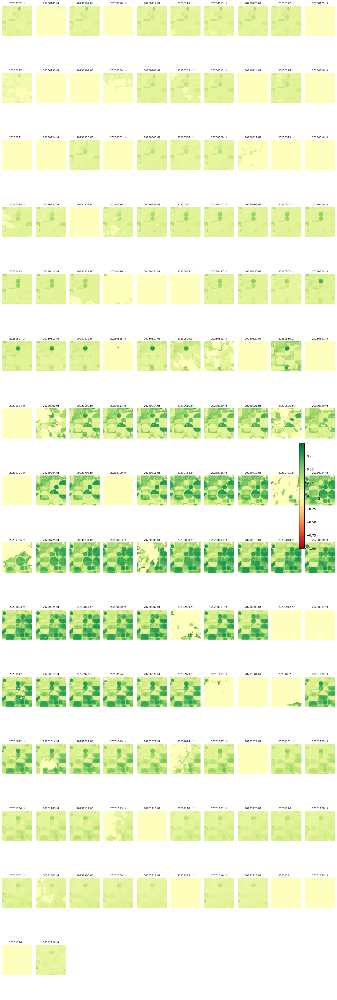

In [31]:
import os
import glob
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Define the tile directory
tile_dir = "/content/Phenological_project/Images/s2/tile_001"

# Get all TIFF file paths (sorted by date)
tif_files = sorted(glob.glob(os.path.join(tile_dir, "*.tif")))

# Number of images to plot
num_images = len(tif_files)

# Define subplot grid (adjust dynamically)
cols = 10  # Number of columns
rows = (num_images // cols) + (1 if num_images % cols else 0)

# Create figure
fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
axes = axes.ravel()  # Flatten for easy indexing

# Loop through NDVI images
for i, tif_file in enumerate(tif_files):
    with rasterio.open(tif_file) as src:
        ndvi = src.read(1).astype(float)  # Read NDVI band

    # Clip NDVI values for visualization
    ndvi = np.clip(ndvi, -1, 1)

    # Plot NDVI
    axes[i].imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    axes[i].set_title(os.path.basename(tif_file), fontsize=8)
    axes[i].axis("off")

# Hide unused subplots if any
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

# Add a shared colorbar
fig.colorbar(plt.cm.ScalarMappable(cmap="RdYlGn", norm=plt.Normalize(-1, 1)), ax=axes, fraction=0.02, pad=0.04, label="NDVI")

# Adjust layout
plt.tight_layout()
plt.show()


## Copy to "GCP"

In [32]:
!gsutil -m cp -r /content/Phenological_project/Images/s2/* gs://ttu_1122/{country}/

Copying file:///content/Phenological_project/Images/s2/tile_000/20230102.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230110.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230331.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230117.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230726.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230902.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230721.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20230825.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/Images/s2/tile_000/20231201.tif [Content-Type=image/tiff]...
Copying file:///content/Phenological_project/I

🚀 Key Updates
✅ Processes each pixel independently for SOS, POS, and EOS.
✅ Finds seasonality metrics for every pixel instead of a single NDVI curve.
✅ Generates spatial maps of SOS, POS, and EOS.
✅ Handles missing values and noisy data.

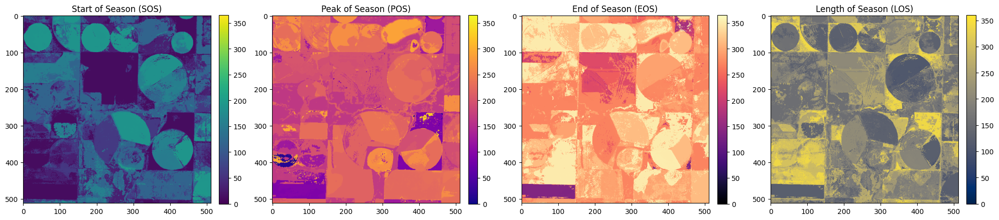

In [103]:
import os
import glob
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import datetime

# Define the directory containing NDVI images
tile_dir = "/content/Phenological_project/Images/s2/tile_002"

# Get all TIFF file paths (sorted by date)
tif_files = sorted(glob.glob(os.path.join(tile_dir, "*.tif")))

# Extract DOY (Day of Year) from filenames (assuming format YYYYMMDD.tif)
dates = [datetime.datetime.strptime(os.path.basename(f).split(".")[0], "%Y%m%d") for f in tif_files]
doy_list = [date.timetuple().tm_yday for date in dates]
month_list = [date.month for date in dates]  # Extract month from YYYYMMDD

# Stack all NDVI images as a 3D array (time, height, width)
ndvi_stack = []

for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        ndvi_stack.append(src.read(1).astype(float))  # Read NDVI band

ndvi_stack = np.array(ndvi_stack)  # Convert to 3D NumPy array (time, height, width)

# Handle missing values (set invalid values to NaN)
ndvi_stack[ndvi_stack < -1] = np.nan  # Assuming invalid NDVI values

# **STEP 1: Apply Savitzky-Golay filter to smooth the time series**
ndvi_smooth_stack = np.apply_along_axis(
    lambda x: savgol_filter(x, window_length=9, polyorder=3, mode='nearest') if np.count_nonzero(~np.isnan(x)) > 9 else x,
    axis=0, arr=ndvi_stack
)

# **STEP 2: Retain all months to keep seasonal variations**
filtered_doy_list = doy_list  # No filtering

# **Function to find SOS, POS, EOS for each pixel using NDVI Gradient**
def find_seasonality(ndvi_series, doy_series, threshold=5):
    """Find SOS, POS, EOS, and Length of Season for a single pixel's NDVI time series."""

    if np.all(np.isnan(ndvi_series)):  # If all values are NaN, return NaN
        return np.nan, np.nan, np.nan, np.nan

    # Compute NDVI gradient (1st derivative)
    grad = np.gradient(ndvi_series)

    # Find Peak of Season (POS)
    pos_index = np.nanargmax(ndvi_series)
    pos_doy = doy_series[pos_index]

    # Find SOS using NDVI gradient increase
    sos_candidates = np.where(grad > np.percentile(grad, 90))[0]  # Steepest 10% increase
    sos_index = sos_candidates[0] if len(sos_candidates) > 0 else 0
    sos_doy = doy_series[sos_index]

    # Find EOS using NDVI gradient decrease
    eos_candidates = np.where(grad[pos_index:] < np.percentile(grad, 10))[0]  # Steepest 10% decrease
    eos_index = eos_candidates[-1] + pos_index if len(eos_candidates) > 0 else len(ndvi_series) - 1
    eos_doy = doy_series[eos_index]

    # Compute Length of Season (LOS)
    los_days = eos_doy - sos_doy if eos_doy >= sos_doy else np.nan  # Ensure LOS is non-negative

    return sos_doy, pos_doy, eos_doy, los_days

# **STEP 3: Initialize empty maps**
sos_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)
pos_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)
eos_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)
los_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)

# **Process every pixel independently**
height, width = ndvi_smooth_stack.shape[1], ndvi_smooth_stack.shape[2]

for i in range(height):
    for j in range(width):
        sos, pos, eos, los = find_seasonality(ndvi_smooth_stack[:, i, j], filtered_doy_list, threshold=5)
        sos_map[i, j] = sos
        pos_map[i, j] = pos
        eos_map[i, j] = eos
        los_map[i, j] = los

# **STEP 4: Plot SOS, POS, EOS, LOS Maps**
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# SOS Map
im1 = axs[0].imshow(sos_map, cmap="viridis", vmin=0, vmax=365)
axs[0].set_title("Start of Season (SOS)")
fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)

# POS Map
im2 = axs[1].imshow(pos_map, cmap="plasma", vmin=0, vmax=365)
axs[1].set_title("Peak of Season (POS)")
fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

# EOS Map
im3 = axs[2].imshow(eos_map, cmap="magma", vmin=0, vmax=365)
axs[2].set_title("End of Season (EOS)")
fig.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04)

# LOS Map
im4 = axs[3].imshow(los_map, cmap="cividis", vmin=0, vmax=np.nanmax(los_map))
axs[3].set_title("Length of Season (LOS)")
fig.colorbar(im4, ax=axs[3], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


In [106]:
print("Unique SOS values:", np.unique(sos_map))
print("Unique POS values:", np.unique(pos_map))
print("Unique EOS values:", np.unique(eos_map))
print("Unique LOS values:", np.unique(los_map))

Unique SOS values: [  2.   5.   7.  10.  12.  22.  25.  27.  30.  32.  35.  40.  45.  47.
  55.  57.  60.  80.  82.  90. 115. 117. 120. 122. 132. 140. 150. 152.
 155. 157. 160. 162. 165. 167. 170. 172. 177. 185. 187. 190. 192. 195.
 197. 200. 202. 205. 207. 210. 212. 215. 217. 220. 225. 227.]
Unique POS values: [ 15.  17.  20.  42.  92.  95.  97. 100. 102. 125. 142. 147. 162. 165.
 167. 170. 172. 177. 180. 182. 185. 187. 192. 195. 197. 200. 202. 205.
 207. 210. 212. 215. 217. 220. 225. 227. 230. 232. 235. 237. 245. 265.
 267. 270. 287. 290. 292. 307. 327. 330.]
Unique EOS values: [132. 135. 137. 150. 152. 157. 167. 170. 172. 185. 190. 195. 200. 202.
 205. 207. 210. 212. 215. 217. 220. 225. 227. 230. 232. 235. 240. 242.
 247. 250. 252. 270. 272. 275. 277. 280. 290. 292. 295. 297. 300. 302.
 305. 312. 315. 317. 320. 322. 325. 327. 330. 332. 335. 337. 340. 342.
 345. 347. 350. 352. 362.]
Unique LOS values: [ 82.  85.  87.  88.  90.  92.  93.  95.  98. 100. 102. 103. 105. 107.
 108. 110. 1

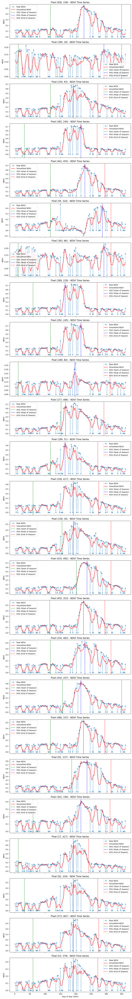

In [107]:
import random

# Select random pixels for visualization
num_samples = 25  # Number of random pixels to check
random_pixels = [(random.randint(0, height-1), random.randint(0, width-1)) for _ in range(num_samples)]

# Plot NDVI time series for selected pixels
fig, axes = plt.subplots(num_samples, 1, figsize=(10, 3 * num_samples), sharex=True)

for idx, (i, j) in enumerate(random_pixels):
    ax = axes[idx]

    # Extract NDVI series for this pixel
    ndvi_series = ndvi_stack[:, i, j]
    smoothed_series = ndvi_smooth_stack[:, i, j]

    # Extract detected SOS, POS, EOS
    sos, pos, eos, _ = find_seasonality(smoothed_series, filtered_doy_list, threshold=5)

    # Plot Raw and Smoothed NDVI
    ax.plot(filtered_doy_list, ndvi_series, "o-", label="Raw NDVI", alpha=0.4)
    ax.plot(filtered_doy_list, smoothed_series, "r-", label="Smoothed NDVI")

    # Mark SOS, POS, EOS
    if not np.isnan(sos):
        ax.axvline(sos, color="green", linestyle="--", label="SOS (Start of Season)")
    if not np.isnan(pos):
        ax.axvline(pos, color="blue", linestyle="--", label="POS (Peak of Season)")
    if not np.isnan(eos):
        ax.axvline(eos, color="red", linestyle="--", label="EOS (End of Season)")

    ax.set_ylabel("NDVI")
    ax.set_title(f"Pixel ({i}, {j}) - NDVI Time Series")
    ax.legend()

plt.xlabel("Day of Year (DOY)")
plt.tight_layout()
plt.show()


## Aggregate as biweekly NDVI (test) to remove noise

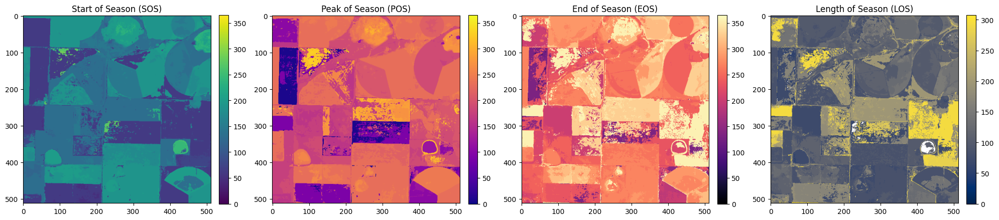

In [116]:
import os
import glob
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import datetime

tile_number = "003"

# Define the directory containing NDVI images
tile_dir = f"/content/Phenological_project/Images/s2/tile_{tile_number}"

# Get all TIFF file paths (sorted by date)
tif_files = sorted(glob.glob(os.path.join(tile_dir, "*.tif")))

# Extract DOY (Day of Year) from filenames (assuming format YYYYMMDD.tif)
dates = [datetime.datetime.strptime(os.path.basename(f).split(".")[0], "%Y%m%d") for f in tif_files]
doy_list = [date.timetuple().tm_yday for date in dates]

# Stack all NDVI images as a 3D array (time, height, width)
ndvi_stack = []

for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        ndvi_stack.append(src.read(1).astype(float))  # Read NDVI band

ndvi_stack = np.array(ndvi_stack)  # Convert to 3D NumPy array (time, height, width)

# Handle missing values (set invalid values to NaN)
ndvi_stack[ndvi_stack < -1] = np.nan  # Assuming invalid NDVI values

# **Fill missing NDVI values: Forward-fill, then mean fill**
def fill_missing_ndvi(ndvi_series):
    """Fill missing NDVI values using forward-fill and mean-fill"""
    if np.all(np.isnan(ndvi_series)):  # If all values are NaN, return NaN
        return ndvi_series

    # Forward fill (replace NaNs with previous valid values)
    mask = np.isnan(ndvi_series)
    ndvi_series[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), ndvi_series[~mask])

    # Fill remaining NaNs (if any) with the mean NDVI
    if np.isnan(ndvi_series).any():
        ndvi_series[np.isnan(ndvi_series)] = np.nanmean(ndvi_series)

    return ndvi_series

# Apply missing value filling across all pixels
ndvi_filled_stack = np.apply_along_axis(fill_missing_ndvi, axis=0, arr=ndvi_stack)

# **STEP 1: Aggregate NDVI into Biweekly Means (Every 14 Days)**
unique_biweeks = sorted(set(doy // 14 for doy in doy_list))  # Group into 14-day bins
biweekly_ndvi = []
biweekly_doy = []

for biweek in unique_biweeks:
    indices = [i for i, doy in enumerate(doy_list) if doy // 14 == biweek]

    if indices:
        biweekly_mean = np.nanmean(ndvi_filled_stack[indices, :, :], axis=0)  # Mean NDVI for the biweek
        biweekly_ndvi.append(biweekly_mean)
        biweekly_doy.append(np.mean([doy_list[i] for i in indices]))  # Avg DOY in biweekly window

biweekly_ndvi = np.array(biweekly_ndvi)  # Convert to 3D NumPy array (time, height, width)

# **STEP 2: Apply Savitzky-Golay Filter to Smoothed Biweekly NDVI**
ndvi_smooth_stack = np.apply_along_axis(
    lambda x: savgol_filter(x, window_length=7, polyorder=3, mode='nearest') if np.count_nonzero(~np.isnan(x)) > 5 else x,
    axis=0, arr=biweekly_ndvi
)

# **STEP 3: Compute SOS, POS, EOS, LOS Based on Smoothed Biweekly NDVI**
def find_seasonality(ndvi_series, doy_series, threshold=5):
    """Find SOS, POS, EOS, and Length of Season for a single pixel's NDVI time series."""

    if np.all(np.isnan(ndvi_series)):  # If all values are NaN, return NaN
        return np.nan, np.nan, np.nan, np.nan

    # Compute NDVI gradient (1st derivative)
    grad = np.gradient(ndvi_series)

    # Find Peak of Season (POS)
    pos_index = np.nanargmax(ndvi_series)
    pos_doy = doy_series[pos_index]

    # Find SOS using NDVI gradient increase
    sos_candidates = np.where(grad > np.percentile(grad, 90))[0]  # Steepest 10% increase
    sos_index = sos_candidates[0] if len(sos_candidates) > 0 else 0
    sos_doy = doy_series[sos_index]

    # Find EOS using NDVI gradient decrease
    eos_candidates = np.where(grad[pos_index:] < np.percentile(grad, 10))[0]  # Steepest 10% decrease
    eos_index = eos_candidates[-1] + pos_index if len(eos_candidates) > 0 else len(ndvi_series) - 1
    eos_doy = doy_series[eos_index]

    # Compute Length of Season (LOS)
    los_days = eos_doy - sos_doy if eos_doy >= sos_doy else np.nan  # Ensure LOS is non-negative

    return sos_doy, pos_doy, eos_doy, los_days

# **STEP 4: Initialize Empty Maps**
sos_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)
pos_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)
eos_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)
los_map = np.full(ndvi_smooth_stack.shape[1:], np.nan)

# **Process Every Pixel Independently**
height, width = ndvi_smooth_stack.shape[1], ndvi_smooth_stack.shape[2]

for i in range(height):
    for j in range(width):
        sos, pos, eos, los = find_seasonality(ndvi_smooth_stack[:, i, j], biweekly_doy, threshold=5)
        sos_map[i, j] = sos
        pos_map[i, j] = pos
        eos_map[i, j] = eos
        los_map[i, j] = los

# **STEP 5: Plot SOS, POS, EOS, LOS Maps**
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# SOS Map
im1 = axs[0].imshow(sos_map, cmap="viridis", vmin=0, vmax=365)
axs[0].set_title("Start of Season (SOS)")
fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)

# POS Map
im2 = axs[1].imshow(pos_map, cmap="plasma", vmin=0, vmax=365)
axs[1].set_title("Peak of Season (POS)")
fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

# EOS Map
im3 = axs[2].imshow(eos_map, cmap="magma", vmin=0, vmax=365)
axs[2].set_title("End of Season (EOS)")
fig.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04)

# LOS Map
im4 = axs[3].imshow(los_map, cmap="cividis", vmin=0, vmax=np.nanmax(los_map))
axs[3].set_title("Length of Season (LOS)")
fig.colorbar(im4, ax=axs[3], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


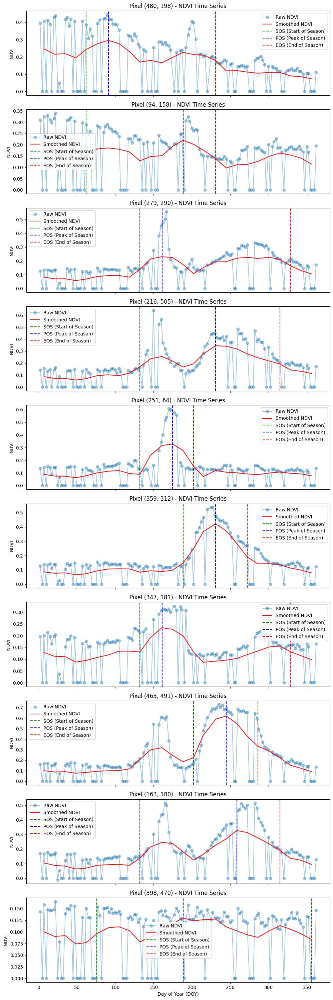

In [117]:
import random
import matplotlib.pyplot as plt

# Select random pixels for visualization
num_samples = 10  # Reduced for better visibility
random_pixels = [(random.randint(0, height-1), random.randint(0, width-1)) for _ in range(num_samples)]

# Create subplots
fig, axes = plt.subplots(num_samples, 1, figsize=(10, 3 * num_samples), sharex=True)

# Plot NDVI time series for selected pixels
for idx, (i, j) in enumerate(random_pixels):
    ax = axes[idx]

    # Extract NDVI series for this pixel
    ndvi_series = ndvi_stack[:, i, j]  # Daily NDVI
    smoothed_series = ndvi_smooth_stack[:, i, j]  # Biweekly Smoothed NDVI

    # Extract detected SOS, POS, EOS
    sos, pos, eos, _ = find_seasonality(smoothed_series, biweekly_doy, threshold=5)

    # Plot Raw NDVI with daily DOY
    ax.plot(filtered_doy_list, ndvi_series, "o-", label="Raw NDVI", alpha=0.4)

    # Plot Smoothed NDVI with biweekly DOY
    ax.plot(biweekly_doy, smoothed_series, "r-", label="Smoothed NDVI")

    # Mark SOS, POS, EOS using biweekly DOY
    if not np.isnan(sos):
        ax.axvline(sos, color="green", linestyle="--", label="SOS (Start of Season)")
    if not np.isnan(pos):
        ax.axvline(pos, color="blue", linestyle="--", label="POS (Peak of Season)")
    if not np.isnan(eos):
        ax.axvline(eos, color="red", linestyle="--", label="EOS (End of Season)")

    ax.set_ylabel("NDVI")
    ax.set_title(f"Pixel ({i}, {j}) - NDVI Time Series")
    ax.legend()

plt.xlabel("Day of Year (DOY)")
plt.tight_layout()
plt.show()


In [123]:
import rasterio
from rasterio.transform import from_origin
import os

output_folder = f"/content/Phenological_project/Images/s2/tile_{tile_number}"
os.makedirs(output_folder, exist_ok=True)

# Get metadata from an existing NDVI image (for CRS and transform)
with rasterio.open(tif_files[0]) as src:
    meta = src.meta.copy()
    transform = src.transform
    crs = src.crs

# Function to save raster as COG using Rasterio's internal options
def save_as_cog(data, output_path, transform, crs):
    """Save array as a Cloud Optimized GeoTIFF (COG) using Rasterio."""
    meta.update({
        "driver": "GTiff",
        "dtype": "float32",
        "count": 1,
        "nodata": np.nan,
        "compress": "LZW",
        "transform": transform,
        "crs": crs,
        "tiled": True  # Enables COG tiling
    })

    with rasterio.open(output_path, "w", **meta) as dst:
        dst.write(data.astype(np.float32), 1)

    print(f"Saved COG: {output_path}")

# Define file paths for COGs
sos_cog = os.path.join(output_folder, "SOS_COG.tif")
pos_cog = os.path.join(output_folder, "POS_COG.tif")
eos_cog = os.path.join(output_folder, "EOS_COG.tif")
los_cog = os.path.join(output_folder, "LOS_COG.tif")

# Save SOS, POS, EOS, LOS directly as COGs
save_as_cog(sos_map, sos_cog, transform, crs)
save_as_cog(pos_map, pos_cog, transform, crs)
save_as_cog(eos_map, eos_cog, transform, crs)
save_as_cog(los_map, los_cog, transform, crs)

Saved COG: /content/Phenological_project/Images/s2/tile_003/SOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_003/POS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_003/EOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_003/LOS_COG.tif


## **Iteration through tiles**

In [127]:
import os
import glob
import rasterio
import numpy as np
import datetime
from scipy.signal import savgol_filter

# Define the directory containing all tiles
base_dir = "/content/Phenological_project/Images/s2/"

# Get a list of all tile directories
tile_dirs = sorted(glob.glob(os.path.join(base_dir, "tile_*")))

# Function to save raster as Cloud Optimized GeoTIFF (COG)
def save_as_cog(data, output_path, transform, crs):
    """Save array as a Cloud Optimized GeoTIFF (COG) using Rasterio."""
    height, width = data.shape  # Ensure height and width are integers

    meta = {
        "driver": "GTiff",
        "dtype": "int16",  # Reduce file size by using int16
        "count": 1,
        "nodata": -9999,
        "compress": "LZW",
        "transform": transform,
        "crs": crs,
        "width": width,
        "height": height,
        "tiled": True
    }

    with rasterio.open(output_path, "w", **meta) as dst:
        dst.write(data.astype(np.int16), 1)  # Convert to int16

    print(f"Saved COG: {output_path}")

# Function to find SOS, POS, EOS, LOS
def find_seasonality(ndvi_series, doy_series, threshold=5):
    """Find SOS, POS, EOS, and Length of Season for a single pixel's NDVI time series."""

    if np.all(np.isnan(ndvi_series)):  # If all values are NaN, return NaN
        return np.nan, np.nan, np.nan, np.nan

    grad = np.gradient(ndvi_series)

    pos_index = np.nanargmax(ndvi_series)
    pos_doy = doy_series[pos_index]

    sos_candidates = np.where(grad > np.percentile(grad, 90))[0]
    sos_index = sos_candidates[0] if len(sos_candidates) > 0 else 0
    sos_doy = doy_series[sos_index]

    eos_candidates = np.where(grad[pos_index:] < np.percentile(grad, 10))[0]
    eos_index = eos_candidates[-1] + pos_index if len(eos_candidates) > 0 else len(ndvi_series) - 1
    eos_doy = doy_series[eos_index]

    los_days = eos_doy - sos_doy if eos_doy >= sos_doy else np.nan

    return sos_doy, pos_doy, eos_doy, los_days

# Process each tile
for tile_dir in tile_dirs:
    tile_number = os.path.basename(tile_dir)  # Extract tile number (e.g., "tile_003")

    print(f"Processing {tile_number}...")

    # Get all TIFF file paths
    tif_files = sorted(glob.glob(os.path.join(tile_dir, "*.tif")))

    if not tif_files:
        print(f"No TIFF files found in {tile_number}. Skipping...")
        continue

    # Extract DOY (Day of Year) from filenames
    dates = [datetime.datetime.strptime(os.path.basename(f).split(".")[0], "%Y%m%d") for f in tif_files]
    doy_list = [date.timetuple().tm_yday for date in dates]

    # Stack NDVI images
    ndvi_stack = []

    for tif_file in tif_files:
        with rasterio.open(tif_file) as src:
            ndvi_stack.append(src.read(1).astype(float))

    # Convert to NumPy array
    if ndvi_stack:
        ndvi_stack = np.array(ndvi_stack)
    else:
        print(f"Skipping {tile_number} due to empty NDVI stack.")
        continue

    # Handle missing values
    ndvi_stack[ndvi_stack < -1] = np.nan

    # Get metadata for saving output (CRS & Transform from the first image)
    with rasterio.open(tif_files[0]) as src:
        transform = src.transform
        crs = src.crs

    # Check dimensions
    if ndvi_stack.ndim != 3 or ndvi_stack.shape[1] == 0 or ndvi_stack.shape[2] == 0:
        print(f"Skipping {tile_number} due to invalid NDVI dimensions: {ndvi_stack.shape}")
        continue

    height, width = ndvi_stack.shape[1], ndvi_stack.shape[2]  # Extract correct dimensions

    # Aggregate NDVI into Biweekly Means (Every 14 Days)
    unique_biweeks = sorted(set(doy // 14 for doy in doy_list))
    biweekly_ndvi = []
    biweekly_doy = []

    for biweek in unique_biweeks:
        indices = [i for i, doy in enumerate(doy_list) if doy // 14 == biweek]

        if indices:
            biweekly_mean = np.nanmean(ndvi_stack[indices, :, :], axis=0)
            biweekly_ndvi.append(biweekly_mean)
            biweekly_doy.append(np.mean([doy_list[i] for i in indices]))

    biweekly_ndvi = np.array(biweekly_ndvi)

    # Apply Savitzky-Golay Filter
    ndvi_smooth_stack = np.apply_along_axis(
        lambda x: savgol_filter(x, window_length=7, polyorder=3, mode='nearest') if np.count_nonzero(~np.isnan(x)) > 5 else x,
        axis=0, arr=biweekly_ndvi
    )

    # Initialize Empty Maps
    sos_map = np.full((height, width), np.nan)
    pos_map = np.full((height, width), np.nan)
    eos_map = np.full((height, width), np.nan)
    los_map = np.full((height, width), np.nan)

    # Process every pixel
    for i in range(height):
        for j in range(width):
            sos, pos, eos, los = find_seasonality(ndvi_smooth_stack[:, i, j], biweekly_doy, threshold=5)
            sos_map[i, j] = sos
            pos_map[i, j] = pos
            eos_map[i, j] = eos
            los_map[i, j] = los

    # Replace NaN values with -9999 (nodata value for int16)
    sos_map[np.isnan(sos_map)] = -9999
    pos_map[np.isnan(pos_map)] = -9999
    eos_map[np.isnan(eos_map)] = -9999
    los_map[np.isnan(los_map)] = -9999

    # Save maps as COGs
    save_as_cog(sos_map, os.path.join(tile_dir, "SOS_COG.tif"), transform, crs)
    save_as_cog(pos_map, os.path.join(tile_dir, "POS_COG.tif"), transform, crs)
    save_as_cog(eos_map, os.path.join(tile_dir, "EOS_COG.tif"), transform, crs)
    save_as_cog(los_map, os.path.join(tile_dir, "LOS_COG.tif"), transform, crs)

print("✅ Processing complete for all tiles!")


Processing tile_000...
Saved COG: /content/Phenological_project/Images/s2/tile_000/SOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_000/POS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_000/EOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_000/LOS_COG.tif
Processing tile_001...
Saved COG: /content/Phenological_project/Images/s2/tile_001/SOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_001/POS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_001/EOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_001/LOS_COG.tif
Processing tile_002...
Saved COG: /content/Phenological_project/Images/s2/tile_002/SOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_002/POS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_002/EOS_COG.tif
Saved COG: /content/Phenological_project/Images/s2/tile_002/LOS_COG.tif
Processing tile_003...
Saved COG: /content/Phenological_project/Ima

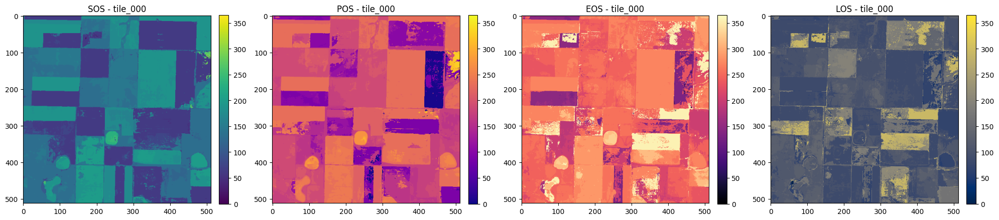

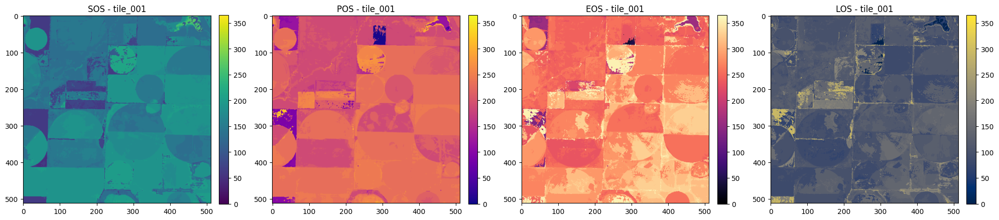

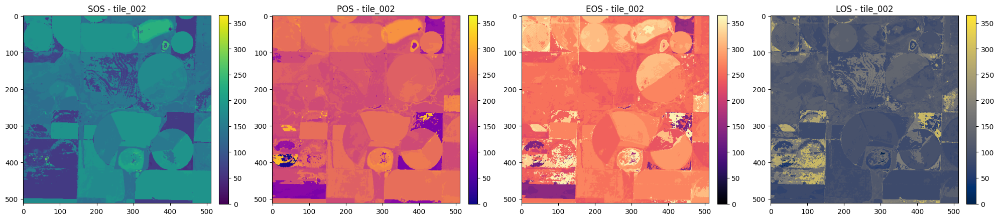

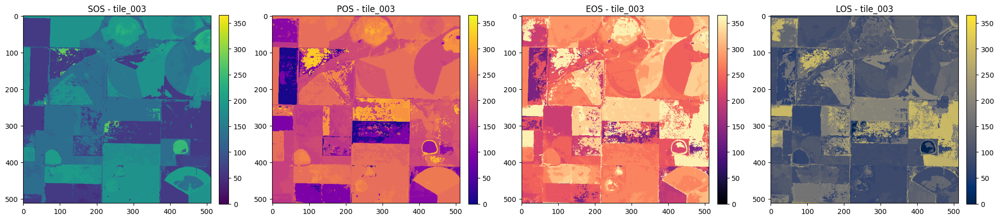

In [129]:
import os
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Define the base directory containing all tiles
base_dir = "/content/Phenological_project/Images/s2/"

# Check if base directory exists
if not os.path.exists(base_dir):
    print(f"❌ Directory not found: {base_dir}")
else:
    # Get a list of all tile directories
    tile_dirs = sorted([d for d in os.listdir(base_dir) if d.startswith("tile_")])

    if not tile_dirs:
        print(f"❌ No tile directories found in {base_dir}")
    else:
        # Define colormap dictionary for different tiles
        tile_colormaps = {
            "SOS": "viridis",
            "POS": "plasma",
            "EOS": "magma",
            "LOS": "cividis"
        }

        # Function to read a GeoTIFF file
        def read_geotiff(filepath):
            """Reads a GeoTIFF file and returns the data."""
            with rasterio.open(filepath) as src:
                return src.read(1)

        # Loop through each tile and visualize the results
        for tile in tile_dirs:
            tile_dir = os.path.join(base_dir, tile)

            cog_files = {
                "SOS": os.path.join(tile_dir, "SOS_COG.tif"),
                "POS": os.path.join(tile_dir, "POS_COG.tif"),
                "EOS": os.path.join(tile_dir, "EOS_COG.tif"),
                "LOS": os.path.join(tile_dir, "LOS_COG.tif"),
            }

            # Check for missing files and read available ones
            data_maps = {name: read_geotiff(path) for name, path in cog_files.items() if os.path.exists(path)}

            # If no valid files are found, skip this tile
            if not data_maps:
                print(f"❌ No valid COG files found for {tile}. Skipping...")
                continue

            # Plot the available maps
            fig, axs = plt.subplots(1, len(data_maps), figsize=(5 * len(data_maps), 5))

            if len(data_maps) == 1:
                axs = [axs]  # Ensure axs is iterable when only one file exists

            for ax, (name, data) in zip(axs, data_maps.items()):
                cmap = tile_colormaps.get(name, "gray")  # Use predefined colormap
                im = ax.imshow(data, cmap=cmap, vmin=0, vmax=365)
                ax.set_title(f"{name} - {tile}")
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

            plt.tight_layout()
            plt.show()


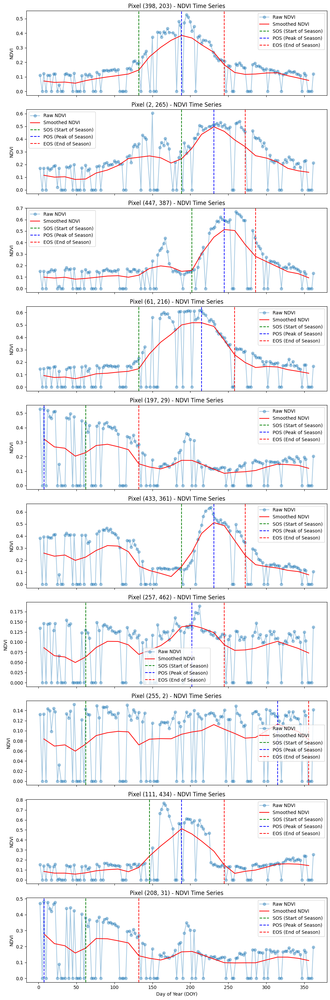

In [130]:
import random
import matplotlib.pyplot as plt

# Select random pixels for visualization
num_samples = 10  # Reduced for better visibility
random_pixels = [(random.randint(0, height-1), random.randint(0, width-1)) for _ in range(num_samples)]

# Create subplots
fig, axes = plt.subplots(num_samples, 1, figsize=(10, 3 * num_samples), sharex=True)

# Plot NDVI time series for selected pixels
for idx, (i, j) in enumerate(random_pixels):
    ax = axes[idx]

    # Extract NDVI series for this pixel
    ndvi_series = ndvi_stack[:, i, j]  # Daily NDVI
    smoothed_series = ndvi_smooth_stack[:, i, j]  # Biweekly Smoothed NDVI

    # Extract detected SOS, POS, EOS
    sos, pos, eos, _ = find_seasonality(smoothed_series, biweekly_doy, threshold=5)

    # Plot Raw NDVI with daily DOY
    ax.plot(filtered_doy_list, ndvi_series, "o-", label="Raw NDVI", alpha=0.4)

    # Plot Smoothed NDVI with biweekly DOY
    ax.plot(biweekly_doy, smoothed_series, "r-", label="Smoothed NDVI")

    # Mark SOS, POS, EOS using biweekly DOY
    if not np.isnan(sos):
        ax.axvline(sos, color="green", linestyle="--", label="SOS (Start of Season)")
    if not np.isnan(pos):
        ax.axvline(pos, color="blue", linestyle="--", label="POS (Peak of Season)")
    if not np.isnan(eos):
        ax.axvline(eos, color="red", linestyle="--", label="EOS (End of Season)")

    ax.set_ylabel("NDVI")
    ax.set_title(f"Pixel ({i}, {j}) - NDVI Time Series")
    ax.legend()

plt.xlabel("Day of Year (DOY)")
plt.tight_layout()
plt.show()


### Export to GCP about final products

In [132]:
import os

# Define your GCS bucket and base directory
gcs_bucket = "gs://ttu_1122"
base_dir = "/content/Phenological_project/Images/s2/"

# Define country variable
country = "phenology_mapOutput"  # Replace with actual country name

# Get a list of all tile directories
tile_dirs = sorted([d for d in os.listdir(base_dir) if d.startswith("tile_")])

# Upload each tile's COG files to GCS
for tile in tile_dirs:
    tile_dir = os.path.join(base_dir, tile)
    gcs_path = f"{gcs_bucket}/{country}/{tile}/"

    # Run gsutil command
    cmd = f"gsutil -m cp -r {tile_dir}/*COG.tif {gcs_path}"
    print(f"Uploading {tile_dir} to {gcs_path} ...")
    os.system(cmd)

print("✅ Upload complete!")


Uploading /content/Phenological_project/Images/s2/tile_000 to gs://ttu_1122/phenology_mapOutput/tile_000/ ...
Uploading /content/Phenological_project/Images/s2/tile_001 to gs://ttu_1122/phenology_mapOutput/tile_001/ ...
Uploading /content/Phenological_project/Images/s2/tile_002 to gs://ttu_1122/phenology_mapOutput/tile_002/ ...
Uploading /content/Phenological_project/Images/s2/tile_003 to gs://ttu_1122/phenology_mapOutput/tile_003/ ...
✅ Upload complete!


## To merge all product tiles

In [133]:
import ee
# Authenticate and initialize Earth Engine
import geemap
ee.Authenticate()
ee.Initialize(project= 'tony-1122')

In [147]:
# Define the AOI
aoi = ee.FeatureCollection('projects/tony-1122/assets/TTU/sorghum/phenology/aoi')

# Function to load images from GCS
def load_images(prefix, tile_count=4):
    images = [ee.Image.loadGeoTIFF(f'gs://ttu_1122/phenology_mapOutput/tile_{str(i).zfill(3)}/{prefix}_COG.tif') for i in range(tile_count)]
    return ee.ImageCollection(images).median()

# Load images for EOS, SOS, POS, LOS
EOS = load_images("EOS")
SOS = load_images("SOS")
POS = load_images("POS")
LOS = load_images("LOS")

# Define a color palette (Magma from Matplotlib)
magma_palette = [
    "000004", "1b0c41", "4a0c6b", "781c6d", "a52c60",
    "cf4446", "ed6925", "fb9b06", "f7d13d", "fcffa4"
]

# Create and display the map
Map = geemap.Map()
Map.addLayer(EOS.selfMask(), {'palette': magma_palette, 'min': 0, 'max': 356}, "EOS", False)
Map.addLayer(SOS.selfMask(), {'palette': magma_palette, 'min': 0, 'max': 356}, "SOS", False)
Map.addLayer(POS.selfMask(), {'palette': magma_palette, 'min': 0, 'max': 356}, "POS", False)
Map.addLayer(LOS.selfMask(), {'palette': magma_palette, 'min': 0, 'max': 356}, "LOS", False)

# Center the map
Map.centerObject(aoi, 12)

# Add layer control
Map.addLayerControl()

# Define legend dictionary
legend_dict = {
    "0": "#000004", "50": "#1b0c41", "100": "#4a0c6b",
    "150": "#781c6d", "200": "#a52c60", "250": "#cf4446",
    "300": "#ed6925", "350": "#fb9b06", "356": "#fcffa4"
}

# Add legend to the map
Map.add_legend(
    title="Phenology Scale (Days)",
    legend_dict=legend_dict
)

# Display the map
Map


Map(center=[35.23233168742634, -101.25898350952922], controls=(WidgetControl(options=['position', 'transparent…

In [146]:

# Function to export images to Earth Engine Asset
def export_to_asset(image, name, asset_path):
    task = ee.batch.Export.image.toAsset(
        image=image,
        description=name,
        assetId=f"{asset_path}/{name}",
        scale=30,  # Adjust resolution if needed
        region=aoi.geometry(),
        crs="EPSG:4326"
    )
    task.start()
    print(f"Exporting {name} to {asset_path}...")

# Set Asset Directory
asset_directory = "projects/tony-1122/assets/TTU/sorghum/phenology/metrics"

# Export images to EE Asset
export_to_asset(EOS, "EOS_Map", asset_directory)
export_to_asset(SOS, "SOS_Map", asset_directory)
export_to_asset(POS, "POS_Map", asset_directory)
export_to_asset(LOS, "LOS_Map", asset_directory)

Exporting EOS_Map to projects/tony-1122/assets/TTU/sorghum/phenology/metrics...
Exporting SOS_Map to projects/tony-1122/assets/TTU/sorghum/phenology/metrics...
Exporting POS_Map to projects/tony-1122/assets/TTU/sorghum/phenology/metrics...
Exporting LOS_Map to projects/tony-1122/assets/TTU/sorghum/phenology/metrics...
